Predicting 3 months of item sales at different stores

In [1]:
import warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from keras import optimizers
from keras.utils import plot_model

from sklearn.metrics import mean_squared_error
from sklearn.model_selection import train_test_split
import plotly

%matplotlib inline
warnings.filterwarnings("ignore")

Using TensorFlow backend.


### Loading data

In [5]:
train=pd.read_csv("C:\\Users\\Majid\\Desktop\\Jupeyetr\\Github\\NLP\\Deep Learning for Time Series Forecasting\\train.csv")

test=pd.read_csv("C:\\Users\\Majid\\Desktop\\Jupeyetr\\Github\\NLP\\Deep Learning for Time Series Forecasting\\test.csv")

In [39]:
train.shape

(913000, 4)

In [40]:
test.shape

(45000, 4)

In [6]:
train.head(5)

,date,store,item,sales
0,2013-01-01,1,1,13
1,2013-01-02,1,1,11
2,2013-01-03,1,1,14
3,2013-01-04,1,1,13
4,2013-01-05,1,1,10


In [42]:
print("Min date from train set=",train["date"][0])

print("Max date from train set=", train["date"][912999])

Min date from train set= 2013-01-01
Max date from train set= 2017-12-31


Time period of the train dataset

In [44]:
print("Max date from train set=", test["date"][0])

print("Max date from test set=", test["date"][44999])

Max date from train set= 2018-01-01
Max date from test set= 2018-03-31


Forecast lag size=90

In [25]:
test.shape

(45000, 4)

In [8]:
test.head(5)

,id,date,store,item
0,0,2018-01-01,1,1
1,1,2018-01-02,1,1
2,2,2018-01-03,1,1
3,3,2018-01-04,1,1
4,4,2018-01-05,1,1


In [9]:
train.describe()

,store,item,sales
count,913000.000000,913000.000000,913000.000000
mean,5.500000,25.500000,52.250287
std,2.872283,14.430878,28.801144
min,1.000000,1.000000,0.000000
25%,3.000000,13.000000,30.000000
50%,5.500000,25.500000,47.000000
75%,8.000000,38.000000,70.000000
max,10.000000,50.000000,231.000000


In [10]:
train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 913000 entries, 0 to 912999
Data columns (total 4 columns):
date     913000 non-null object
store    913000 non-null int64
item     913000 non-null int64
sales    913000 non-null int64
dtypes: int64(3), object(1)
memory usage: 27.9+ MB


In [45]:
daily_sales = train.groupby('date', as_index=False)['sales'].sum()
store_daily_sales = train.groupby(['store', 'date'], as_index=False)['sales'].sum()
item_daily_sales = train.groupby(['item', 'date'], as_index=False)['sales'].sum()

In [47]:
import plotly.graph_objects as go
import plotly.graph_objs as go
from plotly.offline import init_notebook_mode, iplot

daily_sales_sc = go.Scatter(x=daily_sales['date'], y=daily_sales['sales'])
layout = go.Layout(title='Daily sales', xaxis=dict(title='Date'), yaxis=dict(title='Sales'))
fig = go.Figure(data=[daily_sales_sc], layout=layout)
iplot(fig)

In [48]:
store_daily_sales_sc = []
for store in store_daily_sales['store'].unique():
    current_store_daily_sales = store_daily_sales[(store_daily_sales['store'] == store)]
    store_daily_sales_sc.append(go.Scatter(x=current_store_daily_sales['date'], y=current_store_daily_sales['sales'], name=('Store %s' % store)))

layout = go.Layout(title='Store daily sales', xaxis=dict(title='Date'), yaxis=dict(title='Sales'))
fig = go.Figure(data=store_daily_sales_sc, layout=layout)
iplot(fig)

In [49]:
item_daily_sales_sc = []
for item in item_daily_sales['item'].unique():
    current_item_daily_sales = item_daily_sales[(item_daily_sales['item'] == item)]
    item_daily_sales_sc.append(go.Scatter(x=current_item_daily_sales['date'], y=current_item_daily_sales['sales'], name=('Item %s' % item)))

layout = go.Layout(title='Item daily sales', xaxis=dict(title='Date'), yaxis=dict(title='Sales'))
fig = go.Figure(data=item_daily_sales_sc, layout=layout)
iplot(fig)

In [50]:
train = train[(train['date'] >= '2017-01-01')]
#Sub-sample train set to get only the last year of data and reduce training time

In [53]:
train_gp = train.sort_values('date').groupby(['item', 'store', 'date'], as_index=False)
train_gp = train_gp.agg({'sales':['mean']})
train_gp.columns = ['item', 'store', 'date', 'sales']
train_gp.head()

,item,store,date,sales
0,1,1,2017-01-01,19
1,1,1,2017-01-02,15
2,1,1,2017-01-03,10
3,1,1,2017-01-04,16
4,1,1,2017-01-05,14


Transform the data into a time series problem

In [54]:
def series_to_supervised(data, window=1, lag=1, dropnan=True):
    cols, names = list(), list()
    # Input sequence (t-n, ... t-1)
    for i in range(window, 0, -1):
        cols.append(data.shift(i))
        names += [('%s(t-%d)' % (col, i)) for col in data.columns]
    # Current timestep (t=0)
    cols.append(data)
    names += [('%s(t)' % (col)) for col in data.columns]
    # Target timestep (t=lag)
    cols.append(data.shift(-lag))
    names += [('%s(t+%d)' % (col, lag)) for col in data.columns]
    # Put it all together
    agg = pd.concat(cols, axis=1)
    agg.columns = names
    # Drop rows with NaN values
    if dropnan:
        agg.dropna(inplace=True)
    return agg

We will use the current timestep and the last 29 to forecast 90 days ahead

In [66]:
window = 29
lag = 1
series = series_to_supervised(train.drop('date', axis=1), window=window, lag=lag)
series.head()

,store(t-29),item(t-29),sales(t-29),store(t-28),item(t-28),sales(t-28),store(t-27),item(t-27),sales(t-27),store(t-26),...,sales(t-2),store(t-1),item(t-1),sales(t-1),store(t),item(t),sales(t),store(t+1),item(t+1),sales(t+1)
1490,1.0,1.0,19.0,1.0,1.0,15.0,1.0,1.0,10.0,1.0,...,16.0,1.0,1.0,24.0,1,1,9,1.0,1.0,17.0
1491,1.0,1.0,15.0,1.0,1.0,10.0,1.0,1.0,16.0,1.0,...,24.0,1.0,1.0,9.0,1,1,17,1.0,1.0,15.0
1492,1.0,1.0,10.0,1.0,1.0,16.0,1.0,1.0,14.0,1.0,...,9.0,1.0,1.0,17.0,1,1,15,1.0,1.0,17.0
1493,1.0,1.0,16.0,1.0,1.0,14.0,1.0,1.0,24.0,1.0,...,17.0,1.0,1.0,15.0,1,1,17,1.0,1.0,24.0
1494,1.0,1.0,14.0,1.0,1.0,24.0,1.0,1.0,14.0,1.0,...,15.0,1.0,1.0,17.0,1,1,24,1.0,1.0,25.0


In [64]:
series.shape

(182469, 93)

In [65]:
print(series.columns)

Index(['store(t-29)', 'item(t-29)', 'sales(t-29)', 'store(t-28)', 'item(t-28)',
       'sales(t-28)', 'store(t-27)', 'item(t-27)', 'sales(t-27)',
       'store(t-26)', 'item(t-26)', 'sales(t-26)', 'store(t-25)', 'item(t-25)',
       'sales(t-25)', 'store(t-24)', 'item(t-24)', 'sales(t-24)',
       'store(t-23)', 'item(t-23)', 'sales(t-23)', 'store(t-22)', 'item(t-22)',
       'sales(t-22)', 'store(t-21)', 'item(t-21)', 'sales(t-21)',
       'store(t-20)', 'item(t-20)', 'sales(t-20)', 'store(t-19)', 'item(t-19)',
       'sales(t-19)', 'store(t-18)', 'item(t-18)', 'sales(t-18)',
       'store(t-17)', 'item(t-17)', 'sales(t-17)', 'store(t-16)', 'item(t-16)',
       'sales(t-16)', 'store(t-15)', 'item(t-15)', 'sales(t-15)',
       'store(t-14)', 'item(t-14)', 'sales(t-14)', 'store(t-13)', 'item(t-13)',
       'sales(t-13)', 'store(t-12)', 'item(t-12)', 'sales(t-12)',
       'store(t-11)', 'item(t-11)', 'sales(t-11)', 'store(t-10)', 'item(t-10)',
       'sales(t-10)', 'store(t-9)', 'item(t-

Drop rows with different item or store values than the shifted columns

In [67]:
last_item = 'item(t-%d)' % window
print(last_item)
last_store = 'store(t-%d)' % window
print(last_store)
series = series[(series['store(t)'] == series[last_store])]
series = series[(series['item(t)'] == series[last_item])]
series.head(5)

item(t-29)
store(t-29)


,store(t-29),item(t-29),sales(t-29),store(t-28),item(t-28),sales(t-28),store(t-27),item(t-27),sales(t-27),store(t-26),...,sales(t-2),store(t-1),item(t-1),sales(t-1),store(t),item(t),sales(t),store(t+1),item(t+1),sales(t+1)
1490,1.0,1.0,19.0,1.0,1.0,15.0,1.0,1.0,10.0,1.0,...,16.0,1.0,1.0,24.0,1,1,9,1.0,1.0,17.0
1491,1.0,1.0,15.0,1.0,1.0,10.0,1.0,1.0,16.0,1.0,...,24.0,1.0,1.0,9.0,1,1,17,1.0,1.0,15.0
1492,1.0,1.0,10.0,1.0,1.0,16.0,1.0,1.0,14.0,1.0,...,9.0,1.0,1.0,17.0,1,1,15,1.0,1.0,17.0
1493,1.0,1.0,16.0,1.0,1.0,14.0,1.0,1.0,24.0,1.0,...,17.0,1.0,1.0,15.0,1,1,17,1.0,1.0,24.0
1494,1.0,1.0,14.0,1.0,1.0,24.0,1.0,1.0,14.0,1.0,...,15.0,1.0,1.0,17.0,1,1,24,1.0,1.0,25.0


Remove unwanted columns

In [22]:
columns_to_drop = [('%s(t+%d)' % (col, lag)) for col in ['item', 'store']]
for i in range(window, 0, -1):
    columns_to_drop += [('%s(t-%d)' % (col, i)) for col in ['item', 'store']]
series.drop(columns_to_drop, axis=1, inplace=True)
series.drop(['item(t)', 'store(t)'], axis=1, inplace=True)

In [23]:
lag_size=1

## Train/validation split

In [24]:
# Label
labels_col = 'sales(t+%d)' % lag_size
labels = series[labels_col]
series = series.drop(labels_col, axis=1)

X_train, X_valid, Y_train, Y_valid = train_test_split(series, labels.values, test_size=0.4, random_state=0)
print('Train set shape', X_train.shape)
print('Validation set shape', X_valid.shape)
X_train.head()

Train set shape (100799, 30)
Validation set shape (67200, 30)


,sales(t-29),sales(t-28),sales(t-27),sales(t-26),sales(t-25),sales(t-24),sales(t-23),sales(t-22),sales(t-21),sales(t-20),...,sales(t-9),sales(t-8),sales(t-7),sales(t-6),sales(t-5),sales(t-4),sales(t-3),sales(t-2),sales(t-1),sales(t)
394375,48.0,62.0,51.0,67.0,73.0,86.0,65.0,73.0,72.0,73.0,...,91.0,70.0,76.0,64.0,77.0,93.0,74.0,94.0,66.0,69
666432,27.0,24.0,34.0,25.0,24.0,21.0,21.0,31.0,34.0,35.0,...,26.0,24.0,28.0,40.0,20.0,14.0,27.0,22.0,30.0,23
28884,24.0,31.0,34.0,41.0,27.0,35.0,25.0,34.0,41.0,33.0,...,30.0,33.0,43.0,34.0,51.0,26.0,24.0,28.0,35.0,49
689910,76.0,89.0,95.0,90.0,64.0,70.0,67.0,75.0,86.0,81.0,...,86.0,80.0,83.0,80.0,103.0,53.0,91.0,68.0,99.0,94
8883,20.0,22.0,21.0,14.0,11.0,19.0,24.0,19.0,23.0,27.0,...,23.0,18.0,25.0,22.0,28.0,10.0,21.0,21.0,18.0,21


## MLP for Time Series Forecasting

In this lesson, we will discover how to develop a Multilayer Perceptron model or MLP for time series forecasting.

In [25]:
epochs = 10
batch = 256
lr = 0.0003
adam = optimizers.Adam(lr)

In [26]:
from tensorflow.keras.models import Sequential

In [27]:
from tensorflow.keras.models import Sequential, Model
from tensorflow.keras.layers import Conv1D, MaxPooling1D
from tensorflow.keras.layers import Dense, LSTM, RepeatVector, TimeDistributed, Flatten

In [45]:
model=Sequential()

model.add(Dense(100, activation='relu', input_dim=X_train.shape[1]))
model.add(Dense(1))
model.compile(loss='mse', optimizer="adam")
model.summary()

Model: "sequential_5"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_6 (Dense)              (None, 100)               3100      
_________________________________________________________________
dense_7 (Dense)              (None, 1)                 101       
Total params: 3,201
Trainable params: 3,201
Non-trainable params: 0
_________________________________________________________________


In [46]:
mlp_history = model.fit(X_train.values, Y_train, validation_data=(X_valid.values, Y_valid), epochs=epochs, verbose=2)

Train on 100799 samples, validate on 67200 samples
Epoch 1/10
100799/100799 - 10s - loss: 96.0136 - val_loss: 85.4052
Epoch 2/10
100799/100799 - 10s - loss: 88.8736 - val_loss: 82.5960
Epoch 3/10
100799/100799 - 10s - loss: 85.0357 - val_loss: 87.4253
Epoch 4/10
100799/100799 - 10s - loss: 83.4808 - val_loss: 81.6351
Epoch 5/10
100799/100799 - 9s - loss: 83.1431 - val_loss: 86.3913
Epoch 6/10
100799/100799 - 10s - loss: 82.5104 - val_loss: 81.4015
Epoch 7/10
100799/100799 - 10s - loss: 82.5780 - val_loss: 81.8865
Epoch 8/10
100799/100799 - 10s - loss: 81.9199 - val_loss: 80.1608
Epoch 9/10
100799/100799 - 10s - loss: 81.6820 - val_loss: 79.5286
Epoch 10/10
100799/100799 - 10s - loss: 81.4900 - val_loss: 83.1461


In [47]:
loss=mlp_history.history['loss']
val_loss=mlp_history.history['val_loss']

In [48]:
x=list(range(epochs))

In [49]:
import matplotlib.pyplot as plt

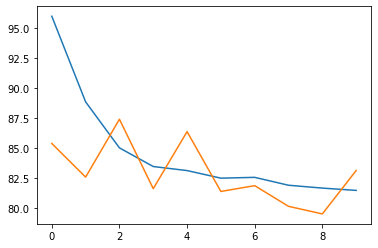

In [50]:
plt.plot(x, loss) #color=blue
plt.plot(x, val_loss)
plt.show()

## CNN for Time Series Forecasting

In this lesson, we will discover how to develop a Convolutional Neural Network model or CNN for time series forecasting.

In [51]:
X_train_series = X_train.values.reshape((X_train.shape[0], X_train.shape[1], 1))
X_valid_series = X_valid.values.reshape((X_valid.shape[0], X_valid.shape[1], 1))
print('Train set shape', X_train_series.shape)
print('Validation set shape', X_valid_series.shape)

Train set shape (100799, 30, 1)
Validation set shape (67200, 30, 1)


In [53]:
model_cnn = Sequential()
model_cnn.add(Conv1D(filters=64, kernel_size=2, activation='relu', input_shape=(X_train_series.shape[1], X_train_series.shape[2])))
model_cnn.add(MaxPooling1D(pool_size=2))
model_cnn.add(Flatten())
model_cnn.add(Dense(50, activation='relu'))
model_cnn.add(Dense(1))
model_cnn.compile(loss='mse', optimizer="adam")
model_cnn.summary()

Model: "sequential_7"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv1d_1 (Conv1D)            (None, 29, 64)            192       
_________________________________________________________________
max_pooling1d_1 (MaxPooling1 (None, 14, 64)            0         
_________________________________________________________________
flatten_1 (Flatten)          (None, 896)               0         
_________________________________________________________________
dense_10 (Dense)             (None, 50)                44850     
_________________________________________________________________
dense_11 (Dense)             (None, 1)                 51        
Total params: 45,093
Trainable params: 45,093
Non-trainable params: 0
_________________________________________________________________


In [54]:
cnn_history = model_cnn.fit(X_train_series, Y_train, validation_data=(X_valid_series, Y_valid), epochs=epochs, verbose=2)

Train on 100799 samples, validate on 67200 samples
Epoch 1/10
100799/100799 - 21s - loss: 99.8864 - val_loss: 96.2232
Epoch 2/10
100799/100799 - 12s - loss: 90.4203 - val_loss: 86.1513
Epoch 3/10
100799/100799 - 12s - loss: 88.9010 - val_loss: 87.6105
Epoch 4/10
100799/100799 - 12s - loss: 87.5233 - val_loss: 85.3000
Epoch 5/10
100799/100799 - 12s - loss: 86.3588 - val_loss: 86.7592
Epoch 6/10
100799/100799 - 12s - loss: 86.0150 - val_loss: 84.8044
Epoch 7/10
100799/100799 - 12s - loss: 85.7822 - val_loss: 83.3995
Epoch 8/10
100799/100799 - 12s - loss: 85.5230 - val_loss: 83.2906
Epoch 9/10
100799/100799 - 12s - loss: 84.9062 - val_loss: 84.2784
Epoch 10/10
100799/100799 - 12s - loss: 85.3366 - val_loss: 83.4487


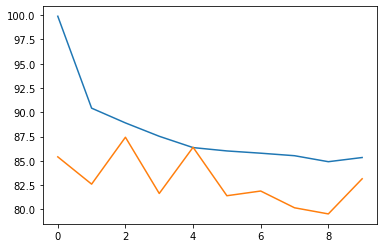

In [56]:
loss=cnn_history.history['loss']
val_loss=cnn_history.history['val_loss']
x=list(range(epochs))
plt.plot(x, loss)  #color=blue
plt.plot(x, val_loss)
plt.show()

### LSTM for Time Series Forecasting

In this lesson, we will discover how to develop a Long Short-Term Memory Neural Network model or LSTM for time series forecasting.

In [58]:
model_lstm = Sequential()
model_lstm.add(LSTM(50, activation='relu', input_shape=(X_train_series.shape[1], X_train_series.shape[2])))
model_lstm.add(Dense(1))
model_lstm.compile(loss='mse', optimizer="adam")
model_lstm.summary()

Model: "sequential_9"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_1 (LSTM)                (None, 50)                10400     
_________________________________________________________________
dense_13 (Dense)             (None, 1)                 51        
Total params: 10,451
Trainable params: 10,451
Non-trainable params: 0
_________________________________________________________________


In [59]:
lstm_history = model_lstm.fit(X_train_series, Y_train, validation_data=(X_valid_series, Y_valid), epochs=epochs, verbose=2)

Train on 100799 samples, validate on 67200 samples
Epoch 1/10
100799/100799 - 114s - loss: 632438537.4861 - val_loss: 167.1841
Epoch 2/10
100799/100799 - 111s - loss: 173.0990 - val_loss: 170.5113
Epoch 3/10
100799/100799 - 111s - loss: 190.4725 - val_loss: 250.2202
Epoch 4/10
100799/100799 - 111s - loss: 522.3259 - val_loss: 166.7534
Epoch 5/10
100799/100799 - 111s - loss: 3655.0894 - val_loss: 5506.1227
Epoch 6/10
100799/100799 - 111s - loss: 80838.6550 - val_loss: 5281.2347
Epoch 7/10
100799/100799 - 111s - loss: 1457.3914 - val_loss: 286.7243
Epoch 8/10
100799/100799 - 111s - loss: 253.3433 - val_loss: 221.2991
Epoch 9/10
100799/100799 - 111s - loss: 203.8724 - val_loss: 185.9005
Epoch 10/10
100799/100799 - 113s - loss: 175.1713 - val_loss: 169.7518


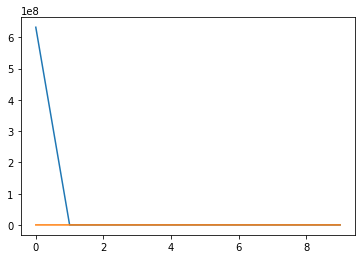

In [60]:
loss=lstm_history.history['loss']
val_loss=lstm_history.history['val_loss']
x=list(range(epochs))
plt.plot(x, loss) #color=blue
plt.plot(x, val_loss)
plt.show()

## CNN-LSTM for Time Series Forecasting

In this lesson, we will discover how to develop a hybrid CNN-LSTM model for time series forecasting.

The benefit of this model is that the model can support very long input sequences that can be read as blocks or
subsequences by the CNN model, then pieced together by the LSTM model.

In [61]:
subsequences = 2
timesteps = X_train_series.shape[1]//subsequences
X_train_series_sub = X_train_series.reshape((X_train_series.shape[0], subsequences, timesteps, 1))
X_valid_series_sub = X_valid_series.reshape((X_valid_series.shape[0], subsequences, timesteps, 1))
print('Train set shape', X_train_series_sub.shape)
print('Validation set shape', X_valid_series_sub.shape)

Train set shape (100799, 2, 15, 1)
Validation set shape (67200, 2, 15, 1)


In [62]:
model_cnn_lstm = Sequential()
model_cnn_lstm.add(TimeDistributed(Conv1D(filters=64, kernel_size=1, activation='relu'), input_shape=(None, X_train_series_sub.shape[2], X_train_series_sub.shape[3])))
model_cnn_lstm.add(TimeDistributed(MaxPooling1D(pool_size=2)))
model_cnn_lstm.add(TimeDistributed(Flatten()))
model_cnn_lstm.add(LSTM(50, activation='relu'))
model_cnn_lstm.add(Dense(1))
model_cnn_lstm.compile(loss='mse', optimizer="adam")

In [63]:
cnn_lstm_history = model_cnn_lstm.fit(X_train_series_sub, Y_train, validation_data=(X_valid_series_sub, Y_valid), epochs=epochs, verbose=2)

Train on 100799 samples, validate on 67200 samples
Epoch 1/10
100799/100799 - 25s - loss: 118.9943 - val_loss: 109.5178
Epoch 2/10
100799/100799 - 23s - loss: 109.7925 - val_loss: 104.6141
Epoch 3/10
100799/100799 - 23s - loss: 108.6780 - val_loss: 105.1376
Epoch 4/10
100799/100799 - 23s - loss: 107.4354 - val_loss: 114.5433
Epoch 5/10
100799/100799 - 24s - loss: 105.4812 - val_loss: 101.1818
Epoch 6/10
100799/100799 - 25s - loss: 108.0855 - val_loss: 105.5573
Epoch 7/10
100799/100799 - 24s - loss: 107.6127 - val_loss: 104.2517
Epoch 8/10
100799/100799 - 24s - loss: 106.1213 - val_loss: 104.1101
Epoch 9/10
100799/100799 - 24s - loss: 105.4809 - val_loss: 104.4423
Epoch 10/10
100799/100799 - 27s - loss: 105.3308 - val_loss: 102.3295


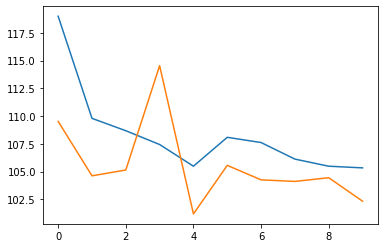

In [64]:
loss=cnn_lstm_history.history['loss']
val_loss=cnn_lstm_history.history['val_loss']
x=list(range(epochs))
plt.plot(x, loss) #color=blue
plt.plot(x, val_loss)
plt.show()